# Multiclass semantic segmentation using DeepLabV3+
https://keras.io/examples/vision/deeplabv3_plus/

## Dataset
Rellis-3D in **All labels (20 classes)**

https://arxiv.org/abs/1811.12596

### Environment tf39

In [1]:
import os
import numpy as np
from glob import glob
import cv2
from scipy.io import loadmat
import matplotlib.pyplot as plt

import keras
from keras import layers
from keras import ops
from keras.applications.resnet import ResNet50
from keras.applications.resnet import preprocess_input

# For data preprocessing
import tensorflow as tf
from tensorflow import image as tf_image
from tensorflow import data as tf_data
from tensorflow import io as tf_io
import warnings
warnings.filterwarnings('ignore')


In [2]:
print(keras.__version__)
print(tf.__version__)

3.0.5
2.16.1


In [3]:
#!pip install tensorflow
!pip check tensorflow

No broken requirements found.


## Loading Rellis-3D Dataset


In [3]:
IMAGE_SIZE = 512
BATCH_SIZE = 4
NUM_CLASSES = 20
TRAIN_DIR = "./rellis20/train"
VALID_DIR = "./rellis20/val"
TEST_DIR = "./rellis20/test"

train_images = sorted(glob(os.path.join(TRAIN_DIR, "images/*")))
train_masks = sorted(glob(os.path.join(TRAIN_DIR, "labels/*")))
val_images = sorted(glob(os.path.join(VALID_DIR, "images/*")))
val_masks = sorted(glob(os.path.join(VALID_DIR, "labels/*")))
test_images = sorted(glob(os.path.join(TEST_DIR, "images/*")))
test_masks = sorted(glob(os.path.join(TEST_DIR, "labels/*")))
test_maskscolors = sorted(glob(os.path.join(TEST_DIR, "masks_colors/*")))

print(len(train_images))
print(len(train_masks))
print(len(val_images))
print(len(val_masks))
print(len(test_images))
print(len(test_masks))
print(len(test_maskscolors))

3302
3302
983
983
1672
1672


In [4]:
print(train_masks[0])

./rellis20/train\labels\frame000000-1581624075_250_20.png


In [5]:
def read_image(image_path, mask=False):
    image = tf_io.read_file(image_path)
    if mask:
        image = tf_image.decode_png(image, channels=1)
        image.set_shape([None, None, 1])
        image = tf_image.resize(images=image, size=[IMAGE_SIZE, IMAGE_SIZE])
    else:
        image = tf_image.decode_png(image, channels=3)
        image.set_shape([None, None, 3])
        image = tf_image.resize(images=image, size=[IMAGE_SIZE, IMAGE_SIZE])
    return image


def load_data(image_list, mask_list):
    image = read_image(image_list)
    mask = read_image(mask_list, mask=True)
    return image, mask


def data_generator(image_list, mask_list):
    dataset = tf_data.Dataset.from_tensor_slices((image_list, mask_list))
    dataset = dataset.map(load_data, num_parallel_calls=tf_data.AUTOTUNE)
    dataset = dataset.batch(BATCH_SIZE, drop_remainder=True)
    return dataset


train_dataset = data_generator(train_images, train_masks)
val_dataset = data_generator(val_images, val_masks)
test_dataset = data_generator(test_images, test_masks)

print("Train Dataset:", train_dataset)
print("Val Dataset:", val_dataset)
print("Test Dataset:", test_dataset)

Train Dataset: <_BatchDataset element_spec=(TensorSpec(shape=(4, 512, 512, 3), dtype=tf.float32, name=None), TensorSpec(shape=(4, 512, 512, 1), dtype=tf.float32, name=None))>
Val Dataset: <_BatchDataset element_spec=(TensorSpec(shape=(4, 512, 512, 3), dtype=tf.float32, name=None), TensorSpec(shape=(4, 512, 512, 1), dtype=tf.float32, name=None))>
Test Dataset: <_BatchDataset element_spec=(TensorSpec(shape=(4, 512, 512, 3), dtype=tf.float32, name=None), TensorSpec(shape=(4, 512, 512, 1), dtype=tf.float32, name=None))>


## Building the DeepLabV3+ model
**DeepLabv3+** amplía DeepLabv3 agregando una estructura codificador-decodificador (decoder-encoder). El módulo codificador procesa información contextual multiescala aplicando convolución dilatada en múltiples escalas, mientras que el módulo decodificador refina los resultados de la segmentación a lo largo de los límites del objeto.

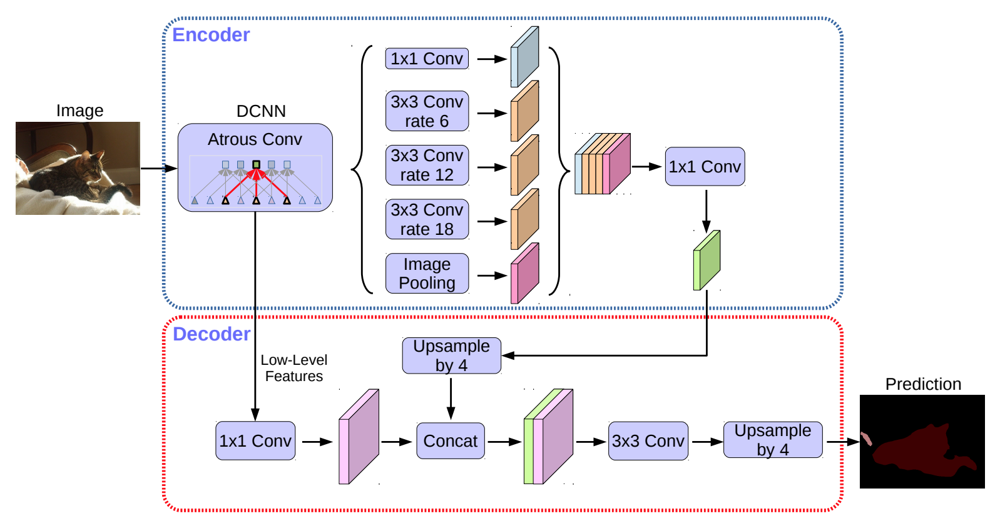

**Convolución dilatada**: con la convolución dilatada, a medida que profundizamos en la red, podemos mantener el paso constante pero con un campo de visión más amplio sin aumentar la cantidad de parámetros o la cantidad de cálculo. Además, permite mapas de características de salida más grandes, lo cual es útil para la segmentación semántica.

La razón para utilizar la **agrupación de pirámides espaciales dilatadas** es que se demostró que a medida que la tasa de muestreo aumenta, la cantidad de ponderaciones de filtro válidas (es decir, ponderaciones que se aplican a la región de características válida, en lugar de ceros rellenos) se reduce.

In [6]:
def convolution_block(
    block_input,
    num_filters=256,
    kernel_size=3,
    dilation_rate=1,
    use_bias=False,
):
    x = layers.Conv2D(
        num_filters,
        kernel_size=kernel_size,
        dilation_rate=dilation_rate,
        padding="same",
        use_bias=use_bias,
        kernel_initializer=keras.initializers.HeNormal(),
    )(block_input)
    x = layers.BatchNormalization()(x)
    return ops.nn.relu(x)

def DilatedSpatialPyramidPooling(dspp_input):
    dims = dspp_input.shape
    x = layers.AveragePooling2D(pool_size=(dims[-3], dims[-2]))(dspp_input)
    x = convolution_block(x, kernel_size=1, use_bias=True)
    out_pool = layers.UpSampling2D(
        size=(dims[-3] // x.shape[1], dims[-2] // x.shape[2]),
        interpolation="bilinear",
    )(x)

    out_1 = convolution_block(dspp_input, kernel_size=1, dilation_rate=1)
    out_6 = convolution_block(dspp_input, kernel_size=3, dilation_rate=6)
    out_12 = convolution_block(dspp_input, kernel_size=3, dilation_rate=12)
    out_18 = convolution_block(dspp_input, kernel_size=3, dilation_rate=18)

    x = layers.Concatenate(axis=-1)([out_pool, out_1, out_6, out_12, out_18])
    output = convolution_block(x, kernel_size=1)
    return output

Las características del encoder primero se muestrean bilinealmente mediante un factor 4 y luego se concatenan con las características de bajo nivel correspondientes de la red troncal que tienen la misma resolución espacial. Para este ejemplo, utilizamos un ResNet50 previamente entrenado en ImageNet como modelo de red troncal y utilizamos las funciones de bajo nivel del bloque conv4_block6_2_relu de la red troncal.

In [7]:
def DeeplabV3Plus(image_size, num_classes):
    model_input = keras.Input(shape=(image_size, image_size, 3))
    preprocessed = preprocess_input(model_input)
    resnet50 = ResNet50(weights="imagenet", include_top=False, input_tensor=preprocessed)
    x = resnet50.get_layer("conv4_block6_2_relu").output
    x = DilatedSpatialPyramidPooling(x)

    input_a = layers.UpSampling2D(
        size=(image_size // 4 // x.shape[1], image_size // 4 // x.shape[2]),
        interpolation="bilinear",
    )(x)
    input_b = resnet50.get_layer("conv2_block3_2_relu").output
    input_b = convolution_block(input_b, num_filters=48, kernel_size=1)

    x = layers.Concatenate(axis=-1)([input_a, input_b])
    x = convolution_block(x)
    x = convolution_block(x)
    x = layers.UpSampling2D(
        size=(image_size // x.shape[1], image_size // x.shape[2]),
        interpolation="bilinear",
    )(x)
    model_output = layers.Conv2D(num_classes, kernel_size=(1, 1), padding="same")(x)
    return keras.Model(inputs=model_input, outputs=model_output)


model = DeeplabV3Plus(image_size=IMAGE_SIZE, num_classes=NUM_CLASSES)
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 512, 512,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item (GetItem)  │ (None, 512, 512)  │          0 │ input_layer[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_1          │ (None, 512, 512)  │          0 │ input_layer[0][0] │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_2          │ (None, 512, 512)  │          0 │ input_layer[0][0] │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stack (Stack)       │ (None, 512, 512,  │          0 │ get_item[0][0],   │
│                     │ 3)                │            │ get_item_1[0][0], │
│                     │                   │            │ get_item_2[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 512, 512,  │          0 │ stack[0][0]       │
│                     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 518, 518,  │          0 │ add[0][0]         │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 256, 256,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 256, 256,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 256, 256,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 258, 258,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 128, 128,  │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 128, 128,  │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 128, 128,  │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 128, 128,  │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 128, 128,  │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 128, 128,  │        256 │ conv2_block1_2_c

 Total params: 11,857,236 (45.23 MB)

 Trainable params: 11,824,500 (45.11 MB)

 Non-trainable params: 32,736 (127.88 KB)

## Training with early stopping, saving model+weights for each epoch and tensorboard


Callbaks de keras para:
- crear checkpoints del modelo con sus pesos para cada época.
- añadir early stopping, cuando el modelo no aprenda durante 3 épocas consecutivas el entrenamiento se detiene
- tensorboard, vemos las gráficas accuracy y loss durante el entrenamiento

In [8]:
from keras import callbacks

checkpoint_filepath='./checkpoint/rellis3D_20/checkpoint.model.keras'
tensorboard_filepath='./checkpoint/rellis3D_20/logs'
#checkpoint_filepath='./checkpoint/rellis3D_6/model.{epoch:02d}-{val_loss:.2f}.h5'

# This callback will stop the training when there is no improvement in
# the loss for 3 consecutive epochs --> patience = 3.
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='loss',  
    patience=3
)

# save the model and weights for each epoch
model_checkpoint = tf.keras.callbacks.ModelCheckpoint(
    checkpoint_filepath,
    monitor="val_accuracy",
    verbose=0,
    save_best_only=False,
    save_weights_only=False,
    mode="max",
    save_freq="epoch",
    initial_value_threshold=None,
)

# histogram frequency for each epoch 
tensorboard = tf.keras.callbacks.TensorBoard(
    log_dir=tensorboard_filepath,
    write_graph=True,
    histogram_freq=1
)

mycallbacks = [
    early_stopping,
    model_checkpoint,
    tensorboard,
]

#mycallbacks = [
#    tf.keras.callbacks.EarlyStopping(monitor='loss', patience=3),
#    tf.keras.callbacks.ModelCheckpoint(filepath='./checkpoint/rellis3D_6/model.{epoch:02d}-{val_loss:.2f}.h5'),
#    tf.keras.callbacks.TensorBoard(log_dir='./checkpoint/rellis3D_6/logs'),
#]

Entrenamos el modelo utilizando entropía cruzada categórica dispersa como función de pérdida y Adam como optimizador y learning rate dinámico

In [9]:
EPOCHS = 100
INITIAL_LR = 0.007 * BATCH_SIZE / 16

# loss function
loss = keras.losses.SparseCategoricalCrossentropy(from_logits=True)

# dinamic learning rate
learning_rate = keras.optimizers.schedules.CosineDecay(
    INITIAL_LR,
    decay_steps=EPOCHS * 2124,
)

model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=0.001),
    loss=loss,
    metrics=["accuracy"],
)

history = model.fit(train_dataset, validation_data=val_dataset, epochs=EPOCHS, callbacks=[mycallbacks])


Epoch 1/100


C:\Users\bfzjs\Anaconda3\envs\tf39\lib\site-packages\keras\src\callbacks\tensorboard.py:671: UserWarning: Model failed to serialize as JSON. Ignoring... Cannot serialize object Ellipsis of type <class 'ellipsis'>. To be serializable, a class must implement the `get_config()` method.
  warnings.warn(f"Model failed to serialize as JSON. Ignoring... {exc}")


 24/825 ━━━━━━━━━━━━━━━━━━━━ 1:07:09 5s/step - accuracy: 0.7415 - loss: 0.9273

KeyboardInterrupt: 

In [ ]:
plt.plot(history.history["loss"], label = "Train")
plt.plot(history.history["val_loss"], label = "Validation")
plt.legend(loc = 'upper right')
plt.title("Loss")
plt.ylabel("loss")
plt.xlabel("epoch")
plt.show()

plt.plot(history.history["accuracy"], label = "Train")
plt.plot(history.history["val_accuracy"], label = "Validation")
plt.legend(loc = 'upper right')
plt.title("Accuracy")
plt.ylabel("accuracy")
plt.xlabel("epoch")
plt.show()

## Métricas
#### Metrica IoU

**Formula**
- iou = true_positives / (true_positives + false_positives + false_negatives)

In [ ]:
num_classes = y_pred.shape[-1]
y_pred = np.array([ np.argmax(y_pred, axis=-1)==i for i in range(num_classes) ]).transpose(1,2,3,0)

axes = (1,2) # W,H axes of each image
intersection = np.sum(np.logical_and(y_pred, y_true), axis=axes)
# intersection = np.sum(np.abs(y_pred * y_true), axis=axes)
union = np.sum(np.logical_or(y_pred, y_true), axis=axes)
mask_sum = np.sum(np.abs(y_true), axis=axes) + np.sum(np.abs(y_pred), axis=axes)
# union = mask_sum  - intersection

smooth = .001
iou = (intersection + smooth) / (union + smooth)
dice = 2 * (intersection + smooth)/(mask_sum + smooth)

iou = np.mean(iou)
dice = np.mean(dice)

## Guardar modelo completo

In [13]:
tf.saved_model.save(model, './model/Test_4.2_DeepLabV3+_Rellis20')


INFO:tensorflow:Assets written to: ./model/Test3_DeepLabV3+_Rellis_All\assets


INFO:tensorflow:Assets written to: ./model/Test3_DeepLabV3+_Rellis_All\assets


## Inferencia mediante superposición de mapa de colores
Las predicciones sin procesar del modelo representan un tensor de forma codificado en caliente (N, 512, 512, num_clases) donde cada uno de los num_clases (canales) es una máscara binaria correspondiente a una etiqueta predicha. Para visualizar los resultados, los trazamos como máscaras de segmentación RGB donde cada píxel está representado por un color único correspondiente a la etiqueta particular predicha. Podemos encontrar fácilmente el color correspondiente a cada etiqueta en el archivo human_colormap.mat proporcionado como parte del conjunto de datos. También trazaríamos una superposición de la máscara de segmentación RGB en la imagen de entrada, ya que esto nos ayuda a identificar las diferentes categorías presentes en la imagen de manera más intuitiva.

In [80]:
# Loading the Colormap
colormap = loadmat(
    "./rellis20/human_colormap.mat"
)["colormap"]
colormap = colormap * 100
colormap = colormap.astype(np.uint8)


def infer(model, image_tensor):
    predictions = model.predict(np.expand_dims((image_tensor), axis=0))
    predictions = np.squeeze(predictions)
    predictions = np.argmax(predictions, axis=2)
    return predictions


def decode_segmentation_masks(mask, colormap, n_classes):
    r = np.zeros_like(mask).astype(np.uint8)
    g = np.zeros_like(mask).astype(np.uint8)
    b = np.zeros_like(mask).astype(np.uint8)
    for l in range(0, n_classes):
        idx = mask == l
        r[idx] = colormap[l, 0]
        g[idx] = colormap[l, 1]
        b[idx] = colormap[l, 2]
    rgb = np.stack([r, g, b], axis=2)
    return rgb


def get_overlay(image, colored_mask):
    image = keras.utils.array_to_img(image)
    image = np.array(image).astype(np.uint8)
    overlay = cv2.addWeighted(image, 0.35, colored_mask, 0.65, 0)
    return overlay


def plot_samples_matplotlib(display_list, figsize=(5, 3)):
    _, axes = plt.subplots(nrows=1, ncols=len(display_list), figsize=figsize)
    for i in range(len(display_list)):
        if display_list[i].shape[-1] == 3:
            axes[i].imshow(keras.utils.array_to_img(display_list[i]))
        else:
            axes[i].imshow(display_list[i])
    plt.show()


def plot_predictions(images_list, colormap, model):
    for image_file in images_list:
        image_tensor = read_image(image_file)
        prediction_mask = infer(image_tensor=image_tensor, model=model)
        #prediction_colormap = decode_segmentation_masks(prediction_mask, colormap, 20)
        prediction_colormap = decode_segmentation_masks(prediction_mask, colormap, NUM_CLASSES)
        overlay = get_overlay(image_tensor, prediction_colormap)
        plot_samples_matplotlib(
            [image_tensor, overlay, prediction_colormap], figsize=(18, 14)
        )
    

## Inferencia en conjunto Train

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


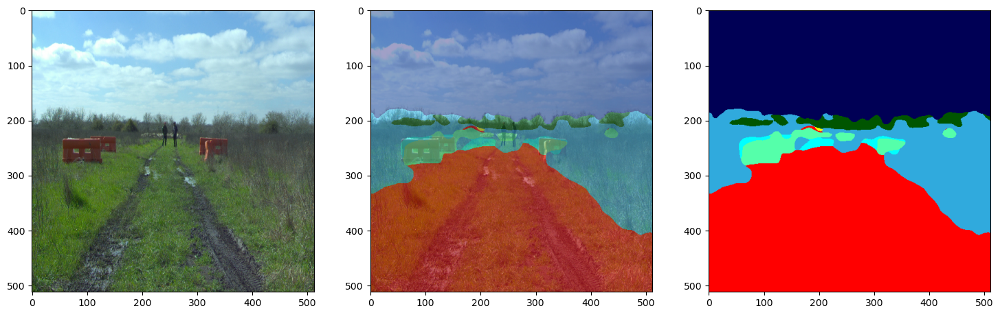

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


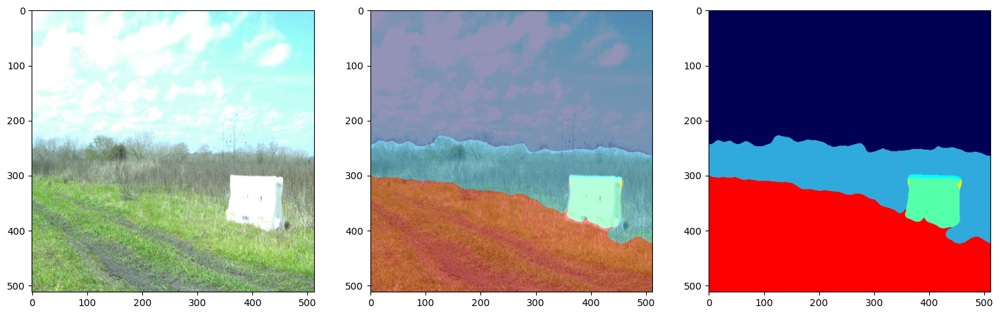

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


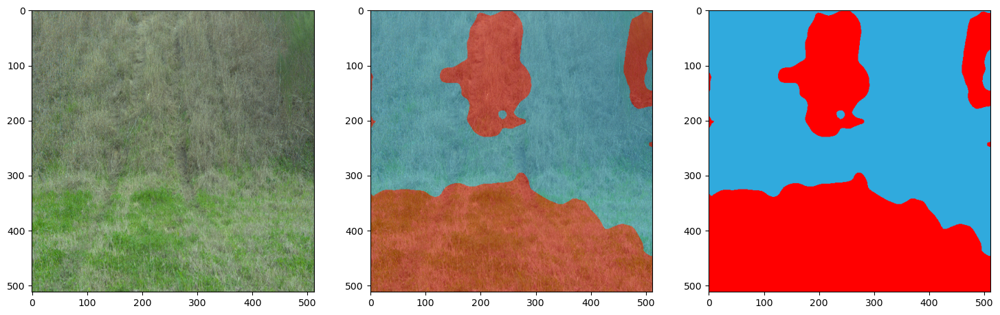

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


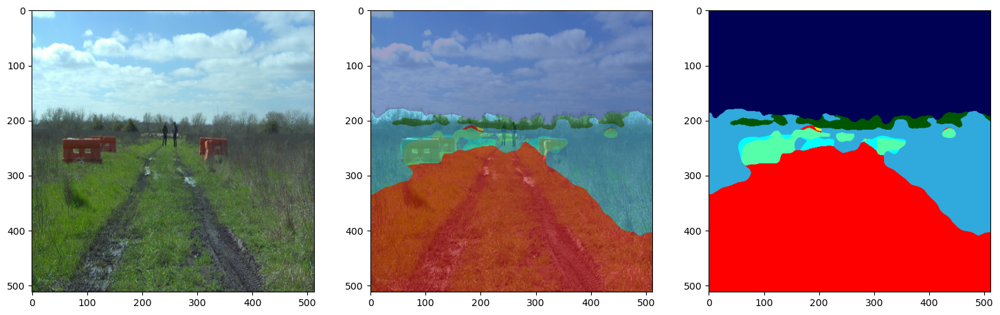

In [81]:
plot_predictions(train_images[:4], colormap, model=model)

## Inferencia en conjunto Test
Puede utilizar el modelo entrenado alojado en Hugging Face Hub y probar la demostración en Hugging Face Spaces.

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


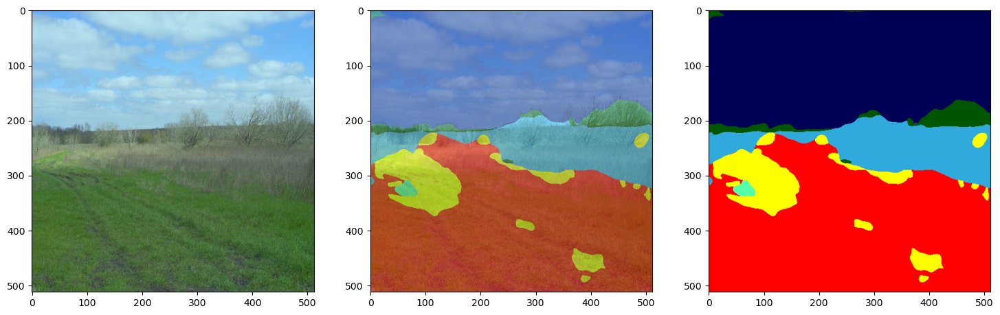

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


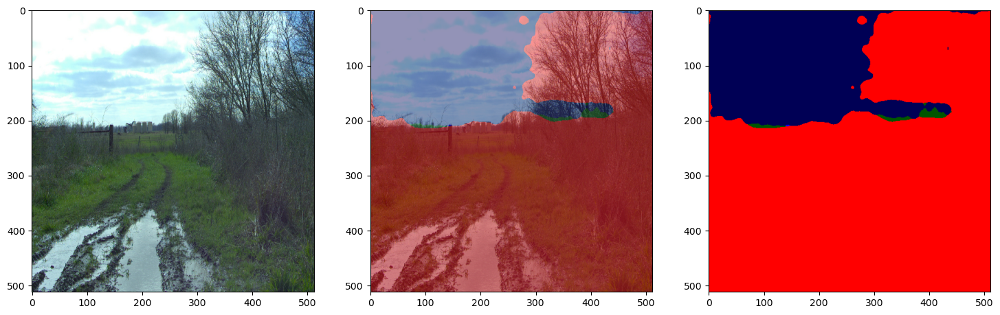

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


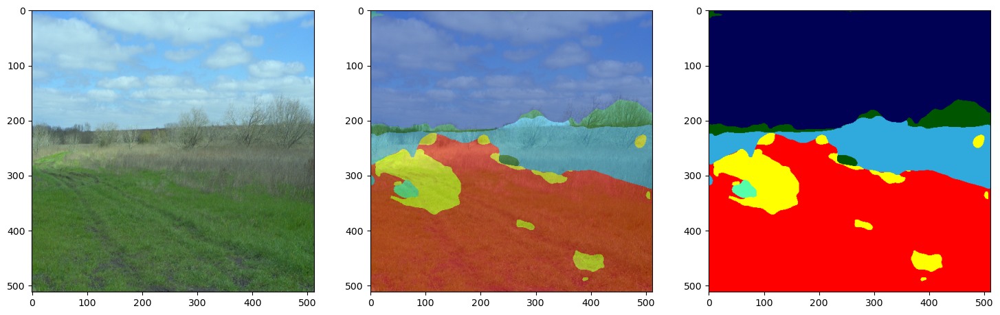

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


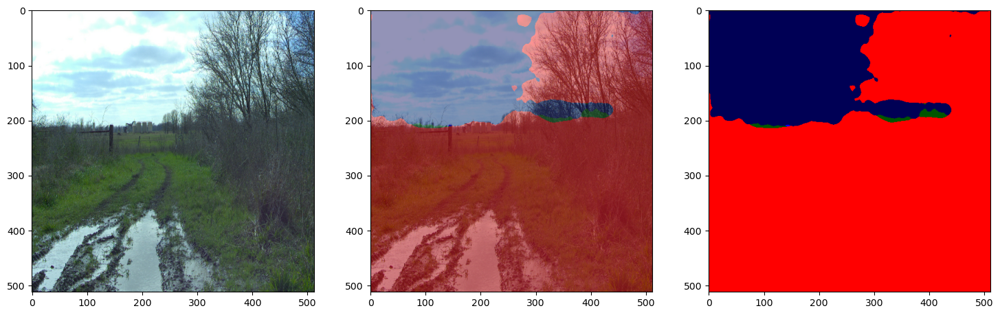

In [82]:
plot_predictions(test_images[:4], colormap, model=model)

## Guardar modelo con predicciones

In [24]:
tf.saved_model.save(model, './model/Test_4.2_RDeepLabV3+_Rellis20_pred')

INFO:tensorflow:Assets written to: ./model/Test3_RDeepLabV3+_RellisAll_pred\assets


INFO:tensorflow:Assets written to: ./model/Test3_RDeepLabV3+_RellisAll_pred\assets


## Visualización

In [46]:
# Seleccionar imágenes RGB del conjunto de test
for filename in test_images[:4]:
    print(filename)

./rellis20/test\images\frame000000-1581623790_349.jpg
./rellis20/test\images\frame000000-1581624652_750.jpg
./rellis20/test\images\frame000002-1581623790_549.jpg
./rellis20/test\images\frame000002-1581624652_949.jpg


In [50]:
# Seleccionar los máscaras GT de las imágenes de test
test_gt = sorted(glob(os.path.join("./rellis20", "GT_test/*")))
print(len(test_gt))
for filename in test_gt[:4]:
    print(filename)

4
./rellis20\GT_test\frame000000-1581623790_349.png
./rellis20\GT_test\frame000000-1581624652_750.png
./rellis20\GT_test\frame000002-1581623790_549.png
./rellis20\GT_test\frame000002-1581624652_949.png


### Estudio del mapa de colores para que coincida con el del dataset original

In [160]:
IDs =    [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 12, 15, 17, 18, 19, 23, 27, 31, 33, 34]
Groups = (0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19)

# ORIGINAL DATASET
CLASSES = ("void", "dirt", "grass", "tree", "pole", "water", "sky", "vehicle", 
            "object", "asphalt", "building", "log", "person", "fence", "bush", 
            "concrete", "barrier", "puddle", "mud", "rubble")

PALETTE = np.array([[0, 0, 0], [108, 64, 20], [0, 102, 0], [0, 255, 0], [0, 153, 153], 
            [0, 128, 255], [0, 0, 255], [255, 255, 0], [255, 0, 127], [64, 64, 64], 
            [255, 0, 0], [102, 0, 0], [204, 153, 255], [102, 0, 204], [255, 153, 204], 
            [170, 170, 170], [41, 121, 255], [134, 255, 239], [99, 66, 34], [110, 22, 138]])

print(type(colormap))
print(type(PALETTE))
print(PALETTE)
print(colormap)

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
[[  0   0   0]
 [108  64  20]
 [  0 102   0]
 [  0 255   0]
 [  0 153 153]
 [  0 128 255]
 [  0   0 255]
 [255 255   0]
 [255   0 127]
 [ 64  64  64]
 [255   0   0]
 [102   0   0]
 [204 153 255]
 [102   0 204]
 [255 153 204]
 [170 170 170]
 [ 41 121 255]
 [134 255 239]
 [ 99  66  34]
 [110  22 138]]
[[ 0  0  0]
 [50  0  0]
 [99  0  0]
 [ 0 33  0]
 [66  0 19]
 [99 33  0]
 [ 0  0 33]
 [ 0 46 86]
 [33 33  0]
 [ 0 33 33]
 [33 19  0]
 [20 33 50]
 [ 0 50  0]
 [ 0  0 99]
 [19 66 86]
 [ 0 99 99]
 [33 99 66]
 [66 99 33]
 [99 99  0]
 [99 66  0]]


In [164]:
# Mostrar RGB vs GT original vs Predicción - Mapa de colores diferente
def plot_GTvsPred(images_list, colormap, test_gt, model):
    print(images_list)
    aux=0
    for image_file in images_list:
        image_tensor = read_image(image_file)
        image_gt = read_image(test_gt[aux])        # Ground Truth
        prediction_mask = infer(image_tensor=image_tensor, model=model)
        prediction_colormap = decode_segmentation_masks(prediction_mask, colormap, NUM_CLASSES)
        overlay = get_overlay(image_tensor, prediction_colormap)
        plot_samples_matplotlib(
            [image_tensor, image_gt, prediction_colormap], figsize=(18, 14)
        )
        aux+=1
        
# Mostrar RGV vs máscara GT superpuesta con colormap vs Predicción
def plot_GTMaskvsPred(images_list, test_gt, mask_gt, model):
    print(test_gt)
    aux=0
    for image_file in images_list:
        image_tensor = read_image(image_file)
        gt_image = read_image(test_gt[aux])        # Ground Truth image
        gt_mask = read_image(mask_gt[aux])         # Ground Truth mask
        prediction_mask = infer(image_tensor=image_tensor, model=model)
        prediction_colormap = decode_segmentation_masks(prediction_mask, PALETTE, NUM_CLASSES)
        
        #gt_mask_colormap = decode_segmentation_masks(gt_mask, PALETTE, NUM_CLASSES)
        print(gt_mask.shape)
        #overlay = get_overlay(image_tensor, gt_mask_colormap)
        
        #print(gt_mask_colormap.shape)
        plot_samples_matplotlib(
            [image_tensor, gt_image, prediction_colormap], figsize=(18, 14)
        )
        aux+=1
     

['./rellis20/test\\images\\frame000000-1581623790_349.jpg', './rellis20/test\\images\\frame000000-1581624652_750.jpg', './rellis20/test\\images\\frame000002-1581623790_549.jpg', './rellis20/test\\images\\frame000002-1581624652_949.jpg']
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


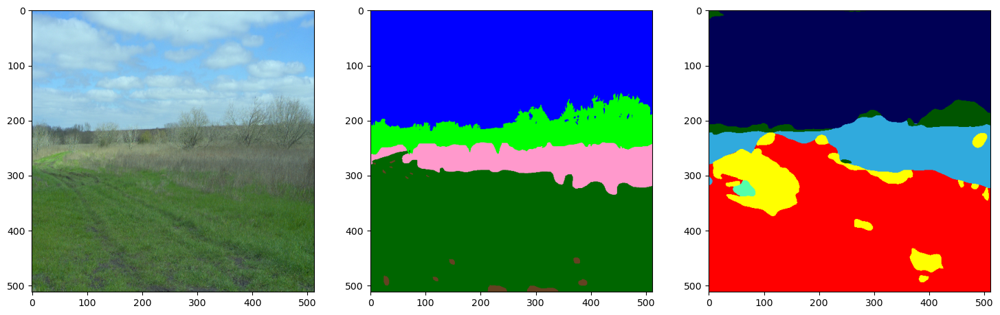

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


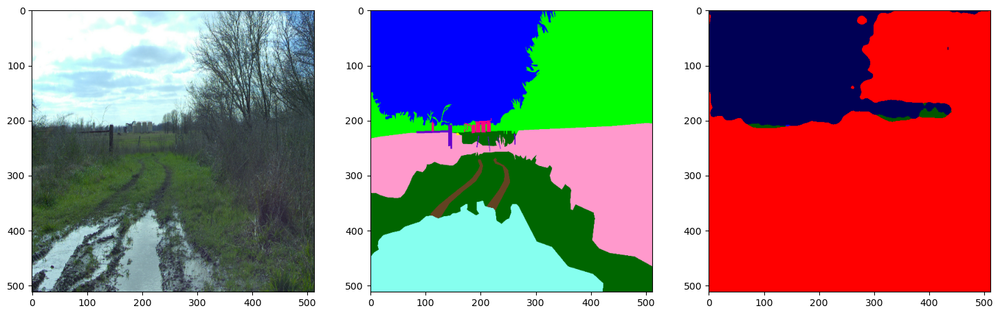

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


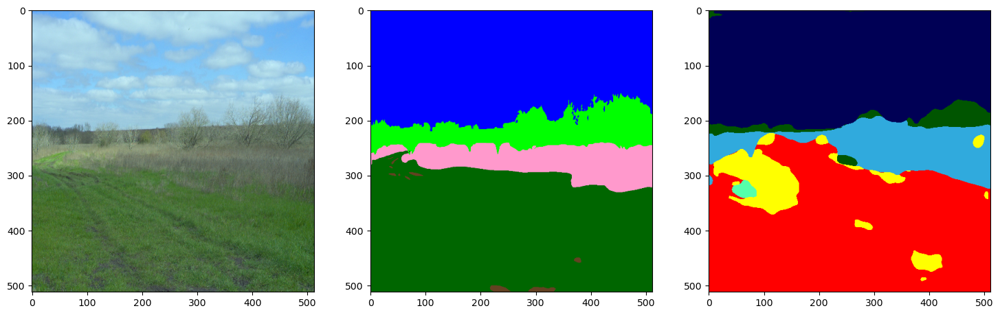

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


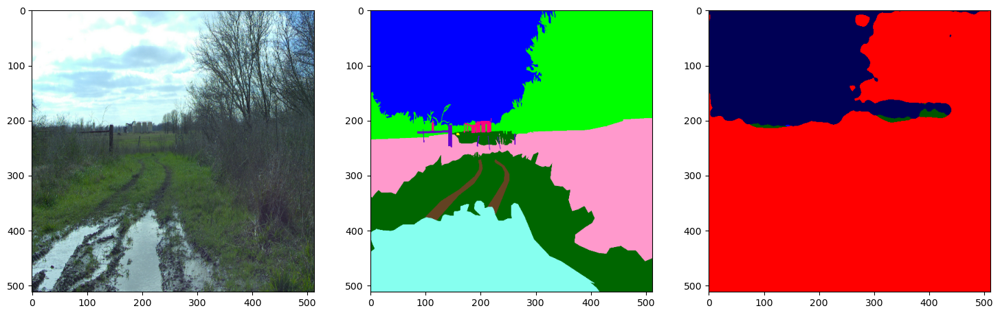

In [165]:
plot_GTvsPred(test_images[:4], colormap,test_gt, model=model)

['./rellis20\\GT_test\\frame000000-1581623790_349.png', './rellis20\\GT_test\\frame000000-1581624652_750.png', './rellis20\\GT_test\\frame000002-1581623790_549.png', './rellis20\\GT_test\\frame000002-1581624652_949.png']
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step
(512, 512, 3)


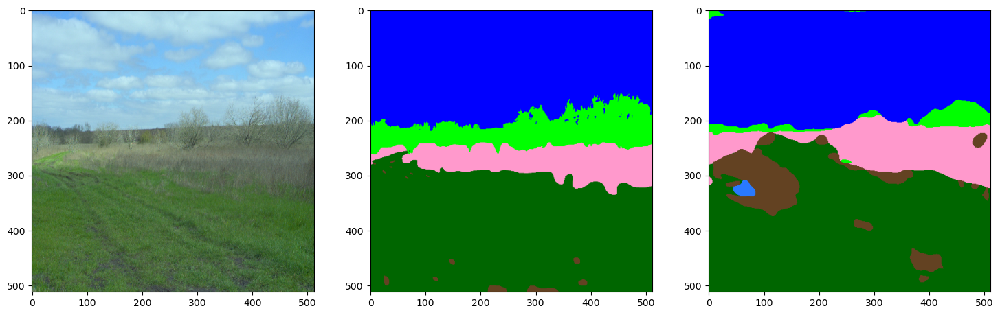

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step
(512, 512, 3)


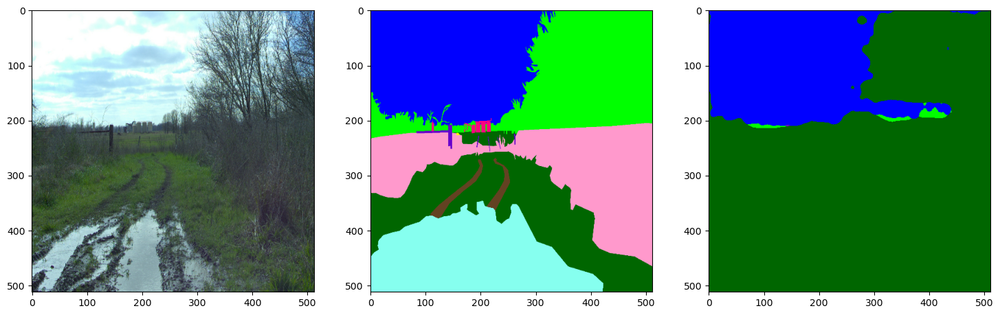

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step
(512, 512, 3)


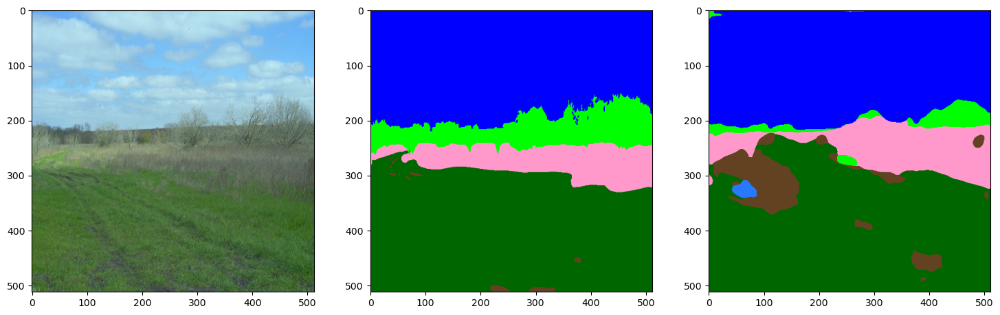

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step
(512, 512, 3)


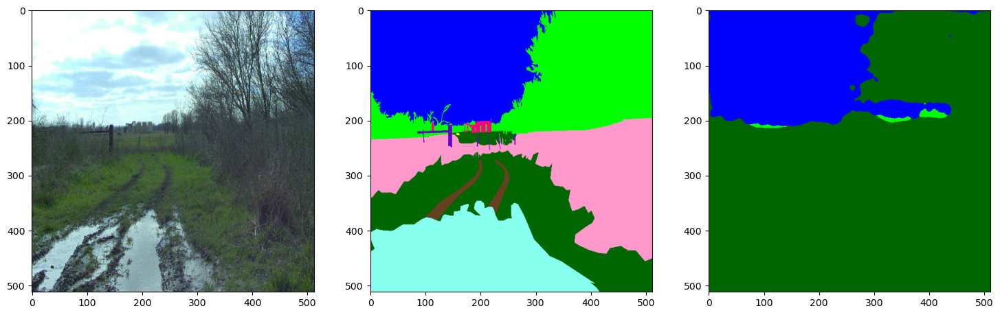

In [166]:
plot_GTMaskvsPred(test_images[:4], test_gt[:4], test_masks[:4], model=model)

In [ ]:
from sklearn.metrics import classification_report
y_true = [0, 1, 2, 2, 2]
y_pred = [0, 0, 2, 2, 1]
target_names = ['class 0', 'class 1', 'class 2']
print(classification_report(y_true, y_pred, target_names=target_names))
